## Reading and viewing satellite data

In [1]:
import geowombat as gwb

---

The test image is a 4-band (ordered red, green, blue, near-infrared) image.

In [2]:
fn = '../data/test.tif'

---

`GeoWombat` uses `Rasterio` or `MpGlue` (default) to load arrays directly from file.

In [3]:
with gwb.open(fn) as src:
    garray = src.read(bands2open=-1)

`garray` is a `GeoWombat GeoArray`, which is just a wrapped `NumPy` array. Therefore, `garray` contains all the usual `NumPy` attributes and methods.

In [4]:
type(garray)

geowombat.geoarray.GeoArray

In [5]:
garray.shape

(4, 1008, 1287)

On top of `NumPy` attributes, `GeoArrays` contain information about the satellite passed from the backend I/O handler. 

In [6]:
garray.extent

[792988.0, 795562.0, 2050382.0, 2048366.0]

In [7]:
garray.cell_y, garray.cell_x

(2.0, -2.0)

In [8]:
garray.crs

'PROJCS["WGS 84 / UTM zone 18N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-75],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32618"]]'

In [9]:
garray.layers, garray.rows, garray.columns

(4, 1008, 1287)

### Defining layer names

Satellite band names can be set at the read level.

In [10]:
with gwb.open(fn) as src:
    garray = src.read(names=['red', 'green', 'blue', 'nir'], bands2open=-1)

In [11]:
garray.layer_names

['red', 'green', 'blue', 'nir']

Layer names can also be set after opening the file.

In [12]:
garray.set_names(['red', 'green', 'blue', 'nir'])

Being a view of a `NumPy` array, array layers can be sliced in the usual way.

In [13]:
layer1 = garray[0]

In [14]:
layer1.shape

(1008, 1287)

If the layer names are defined, they can be accessed as attributes.

In [15]:
layer1 = garray.red

In [16]:
layer1.shape

(1008, 1287)

### Plotting

`GeoArrays` support plotting directly from the object. If the array is not a 1-band or 3-band array, the band positions for plotting must be defined.

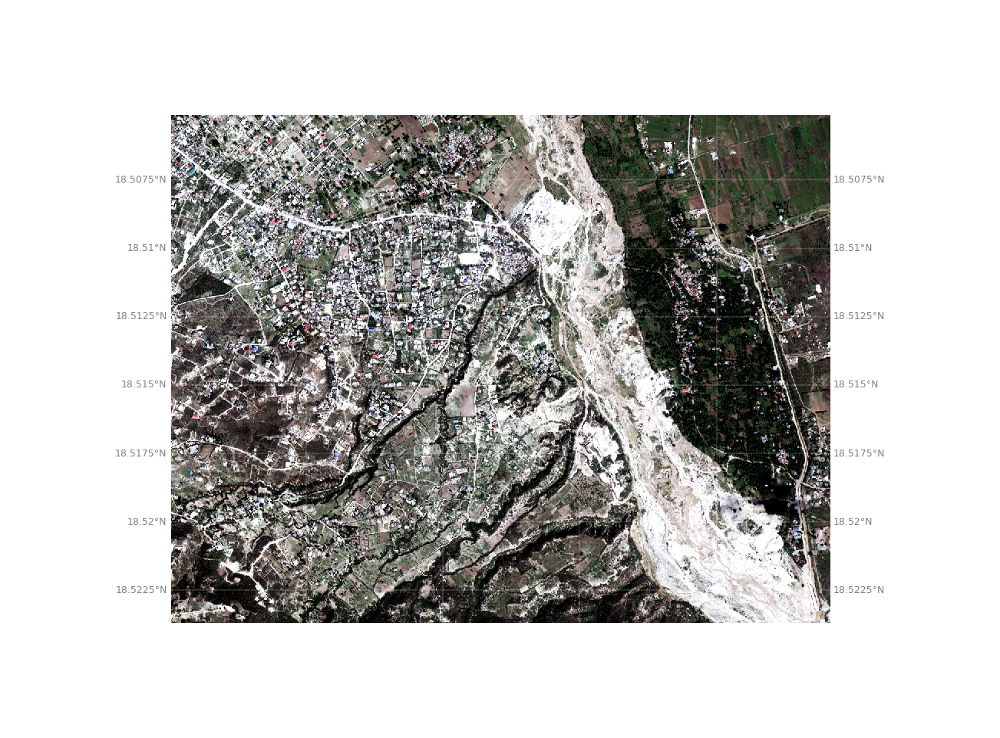

In [17]:
garray.show(bands=[3, 2, 1])

Adjust the min/max stretch

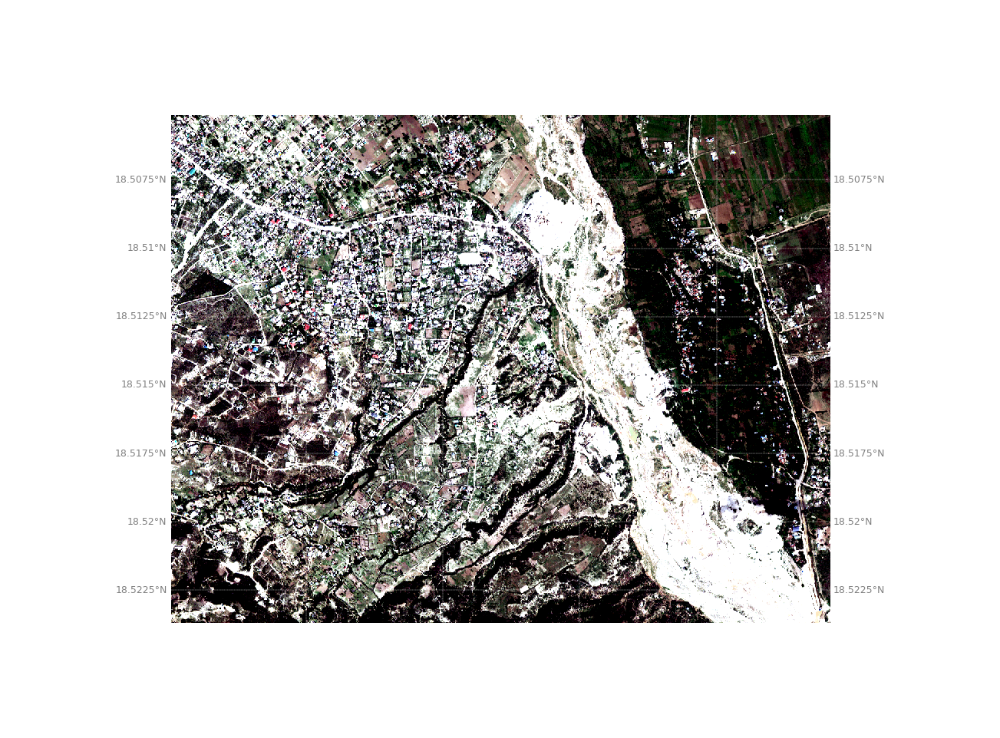

In [20]:
garray.show(bands=[3, 2, 1], percentiles=(20, 80))

Plot a single layer

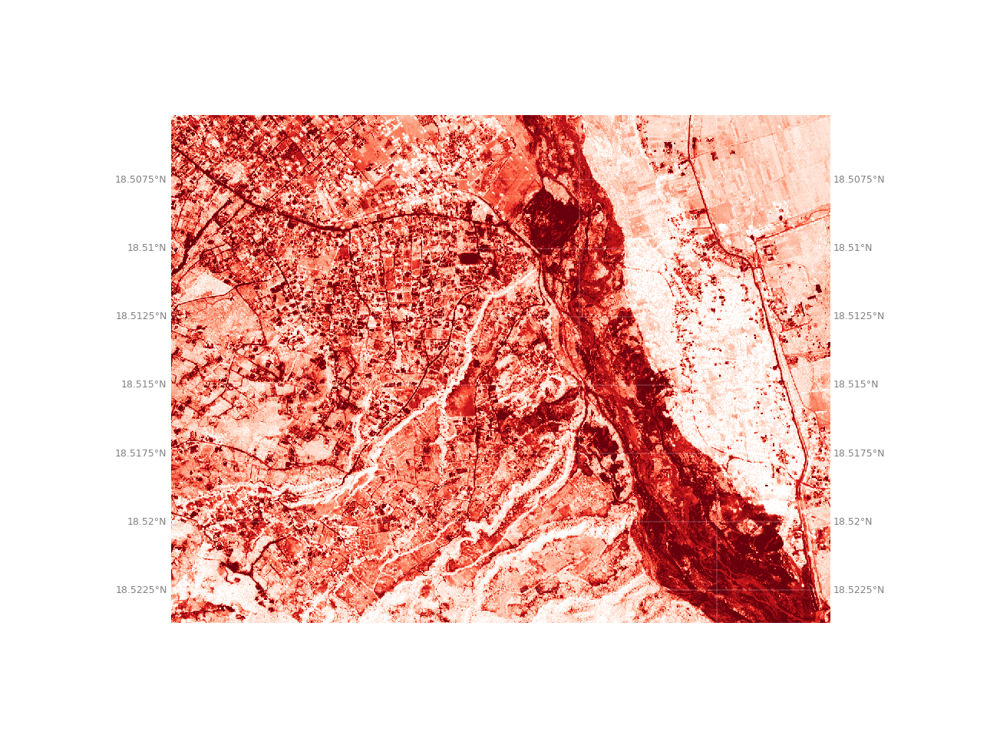

In [21]:
garray.show(bands=1, cmap='Reds')

Plot a single layer by calling the name attribute

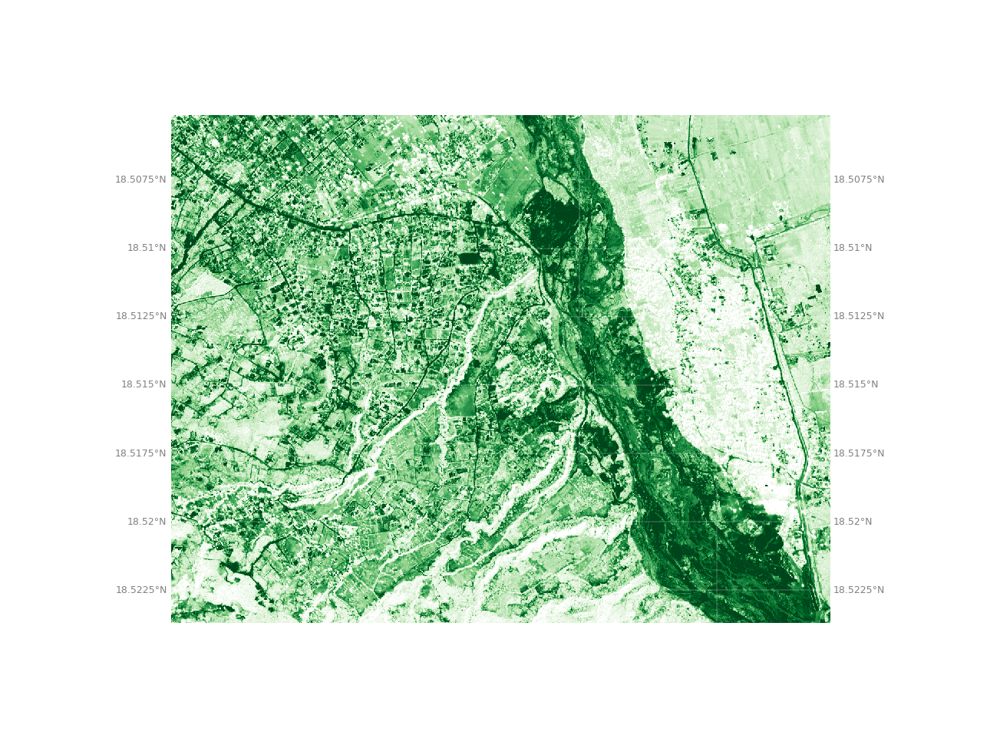

In [22]:
garray.green.show(cmap='Greens')

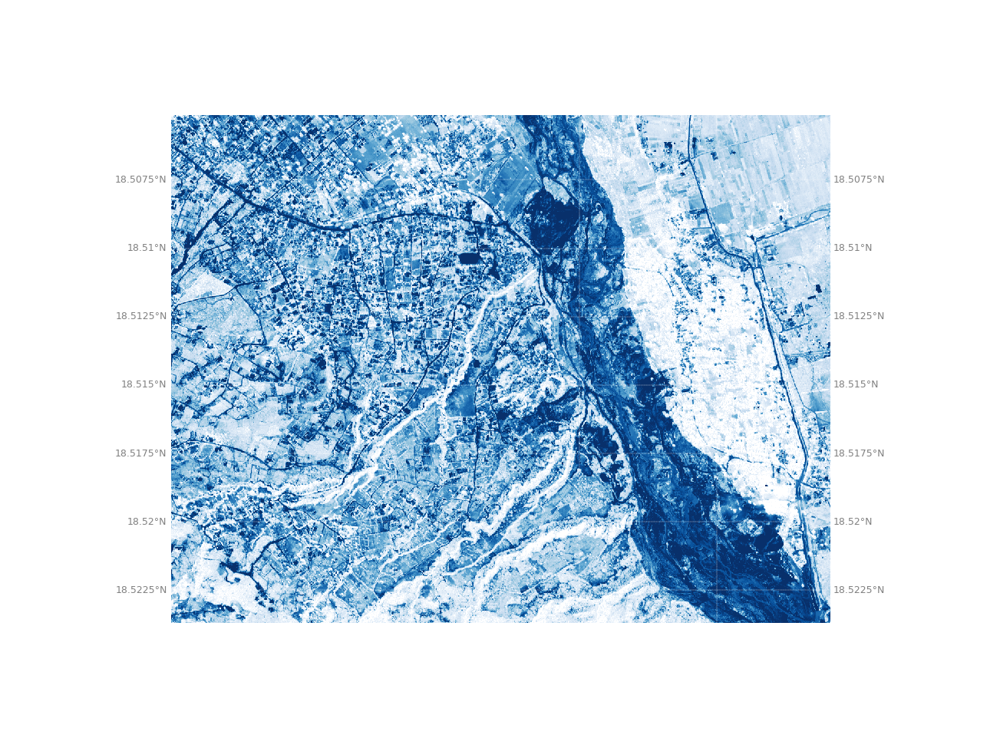

In [23]:
garray.blue.show(cmap='Blues')

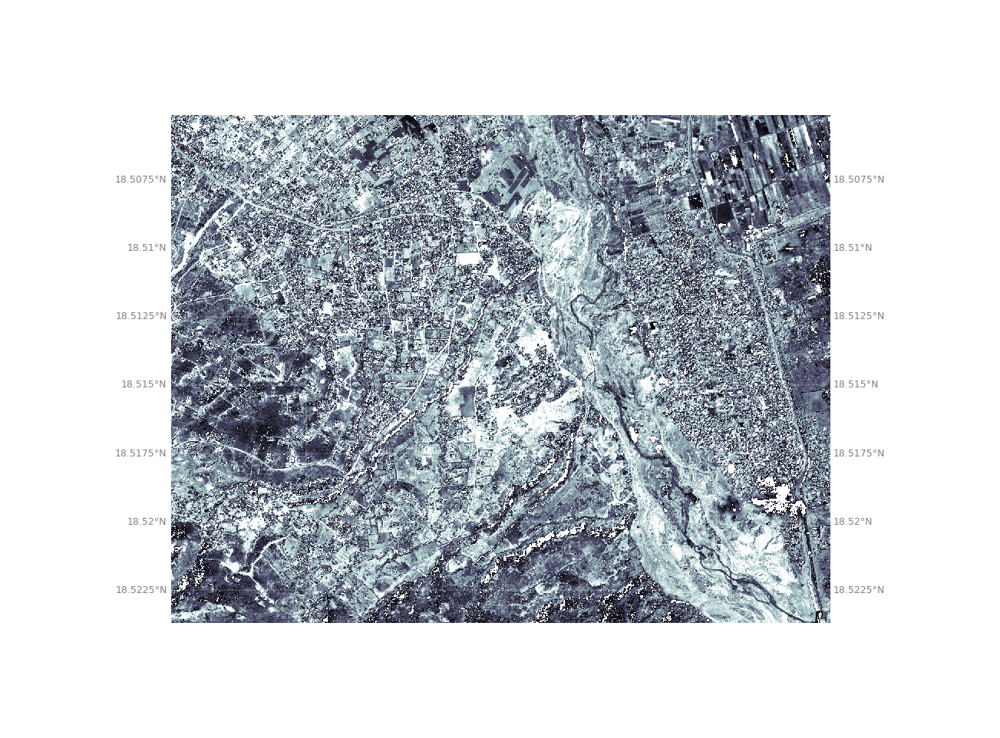

In [24]:
garray.nir.show(cmap='bone')